# BÁO CÁO ĐỒ ÁN



## Người thực hiện: <br>
19127519 - Nguyễn Ngọc Phước <br>
19127257 - Phạm Nhật Quang <br>
19127213 - Trần Hoàng Minh <br>


## 1.Application Description

**Application name** 

Seam carving

**Input**

Image (RGB image)

**Output**

Resized image (Smaller/Larger) without distorting important objects

**Use case**

Displaying images without distortion on media of various sizes (cell phones, projection screens)

**Performance** 

Computing optimal sequence of carving steps using dynamic programming for large images is not practical.



# Input for experiment

The following pictures will be used for testing throughout all versions

512 pixels picture

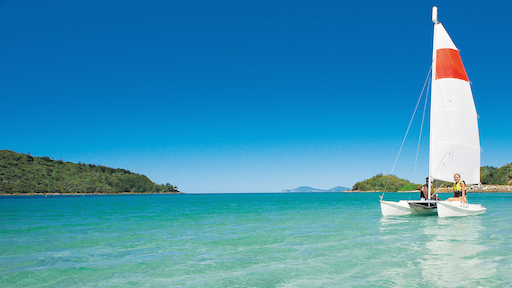

1024 pixels picture

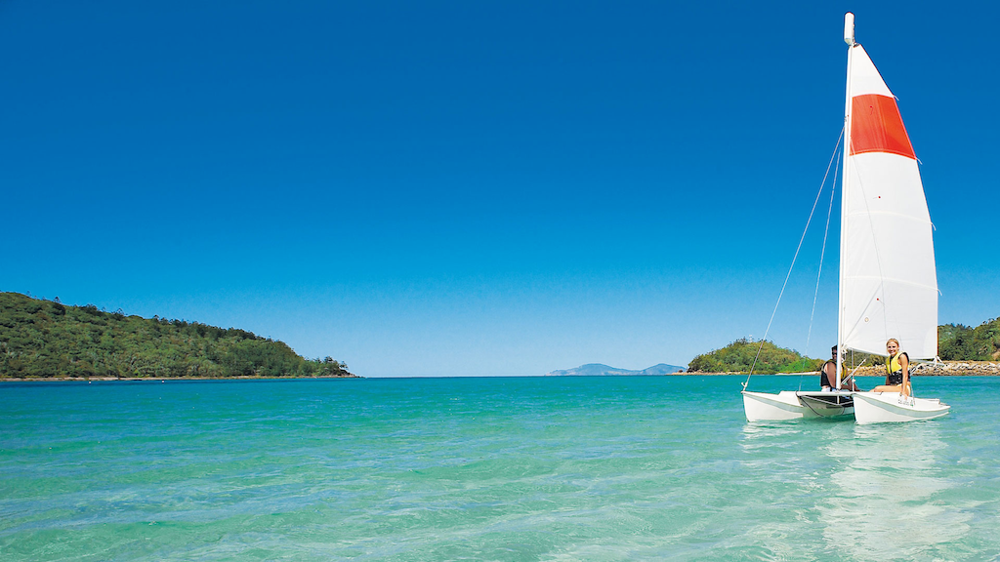

## 2. Sequential implementation

**Design**

*  Step 1: Convert RGB image to grayscale image

*  Step 2: Using Edge Detection to compute importance/energy of each pixel <br>
  *  Step 2.1: Detect edges in the x-direction (1): do convolution of this
grayscale image with x-Sobel filter
  *  Step 2.2: Detect edges in the y-direction (2): do convolution of this
grayscale image with y-Sobel filter
  *  Step 2.3: Compute importance of a pixel = abs(1) + abs(2)

*  Step 3: Find the least important seam
from pixel importances 

  *  Step 3.1: Compute minimum cost table and path table
  *  Step 3.2: Find minimum energy and trace back

*  Step 4: Remove/Duplicate the least important seam
from pixel importances to make the picture smaller/larger

*  Step 5: Repeat step 2 until we reach the desired size



**Experiments and Result**

We will delete and add 50 seam in 512 and 1024 pixel pictures using sequential implementation

**1. Remove seam using sequential method**

  *Input* 

  512 pixels picture

  *Output*

  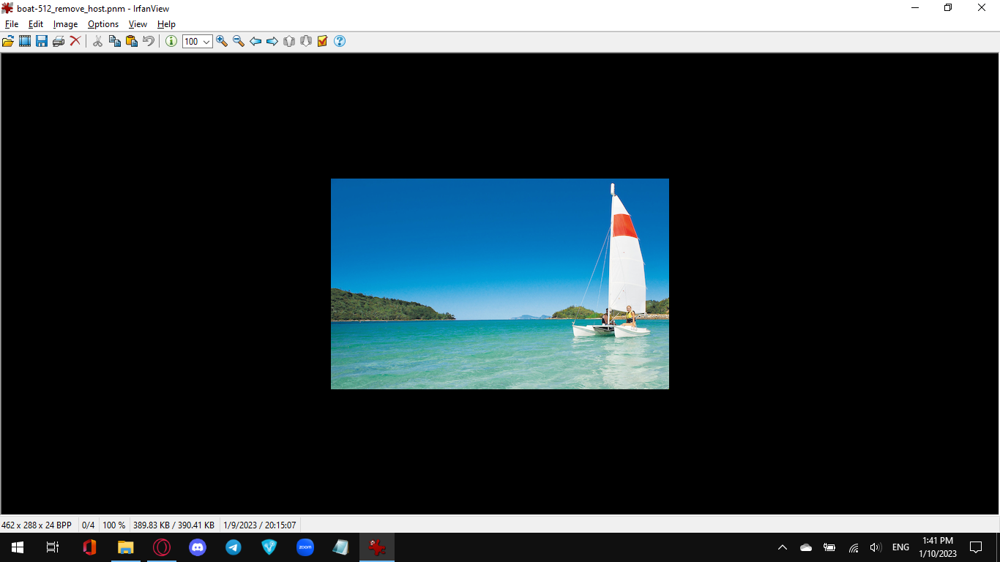

*Input*

1024 pixels picture

*Output*

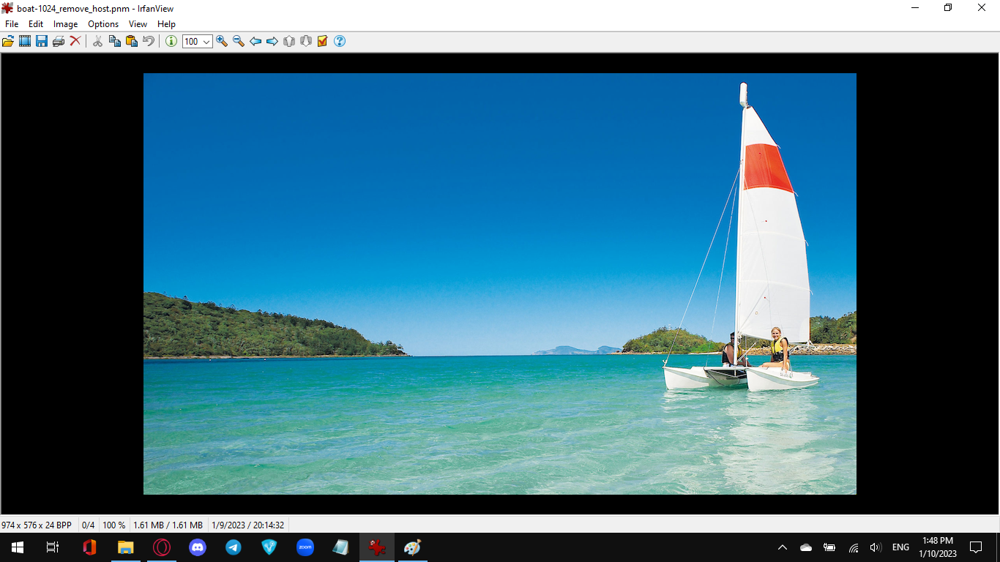


**2. Add using sequential method**

  *Input* 
  
  512 pixels picture

  *Output*


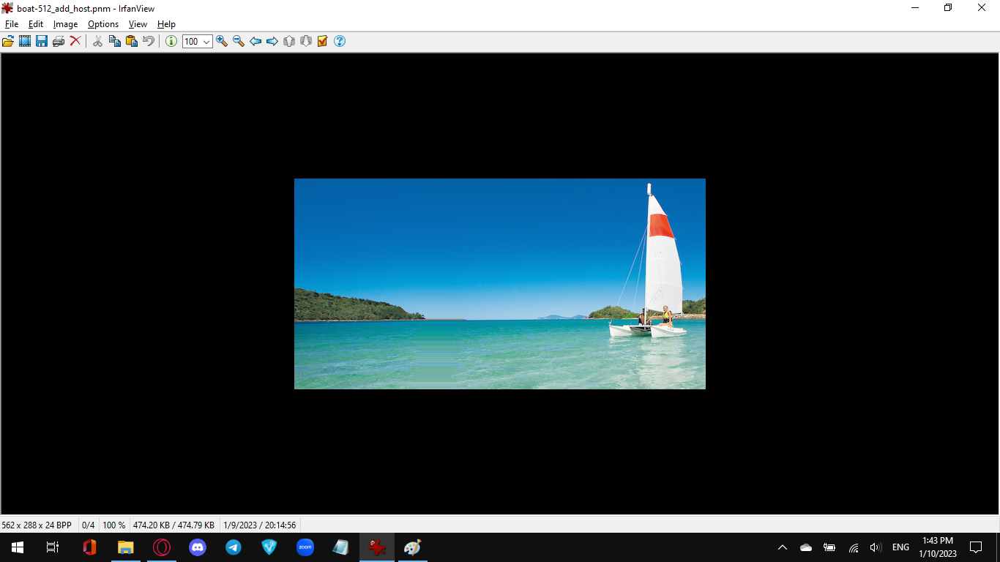

*Input*

1024 pixels picture

*Output*

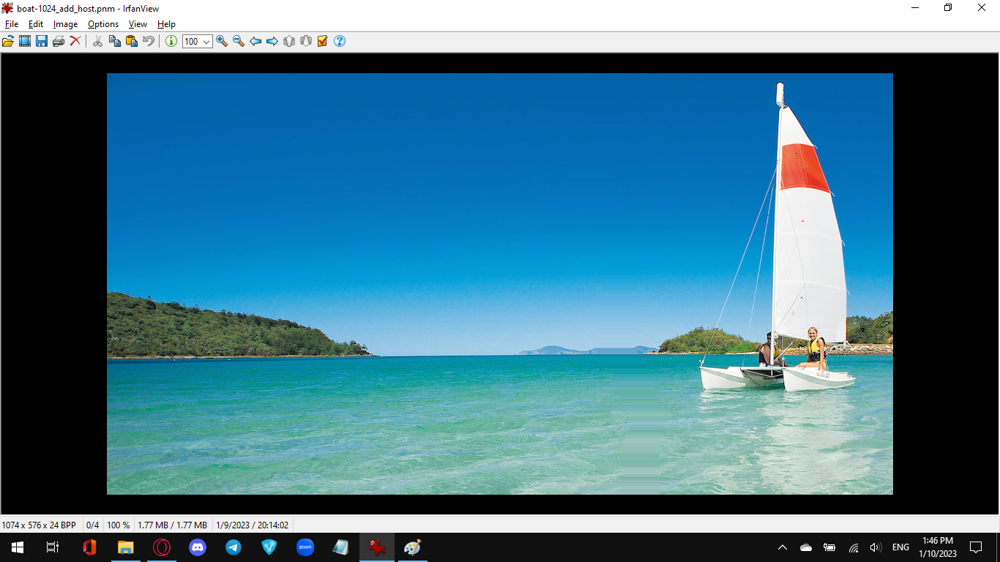

## 3. Parallel implementation

**Analyze + Design**

We will parallelize the following steps:

*   Step 1: Gray scale → Each thread will handle 1 pixel from the original image

*   Step 2: Computing pixel energy using edge detection
    *   Step 2.1: Detect edges in the x-direction (1): do convolution of this
grayscale image with x-Sobel filter → Each thread will do convolution for 1 pixel from the grayscale image
    *   Step 2.2: Detect edges in the y-direction (2): do convolution of this
grayscale image with y-Sobel filter → Each thread will do convolution for 1 pixel from the grayscale image
    *   Step 2.3: Compute importance of a pixel = abs(1) + abs(2) → Each thread will handle the sum of 2 pixels
    *   Step 3.1: Compute minimum cost table and path table → Iterate through each row on host, for each row on device, 1 thread will handle creating a new cost cell
    *   Step 3.2: Find minimum energy and trace back → On device, reduce to find minimum value and trace back on host.

*  Step 4: Remove/Duplicate the least important seam →  Each thread will copy and calculate 1 pixel to the new image.



**Evaluate** 

We will delete and add  100 seam in 512 and 1024 pixel pictures using naive parallel implementation

**Experiments and result**

Based on the colab results, we can see that the code runs correctly and runs faster

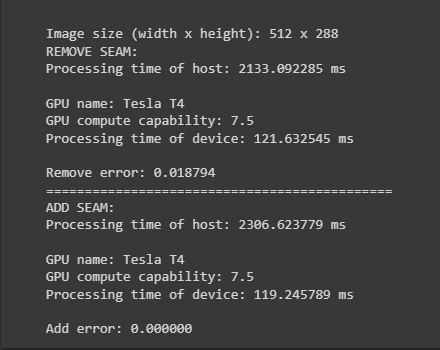

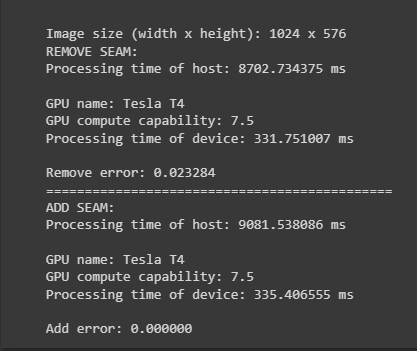

The following pictures will show the result when we remove/add 50 seams to the 512 pixels picture (respectively) using naive parallel implementation

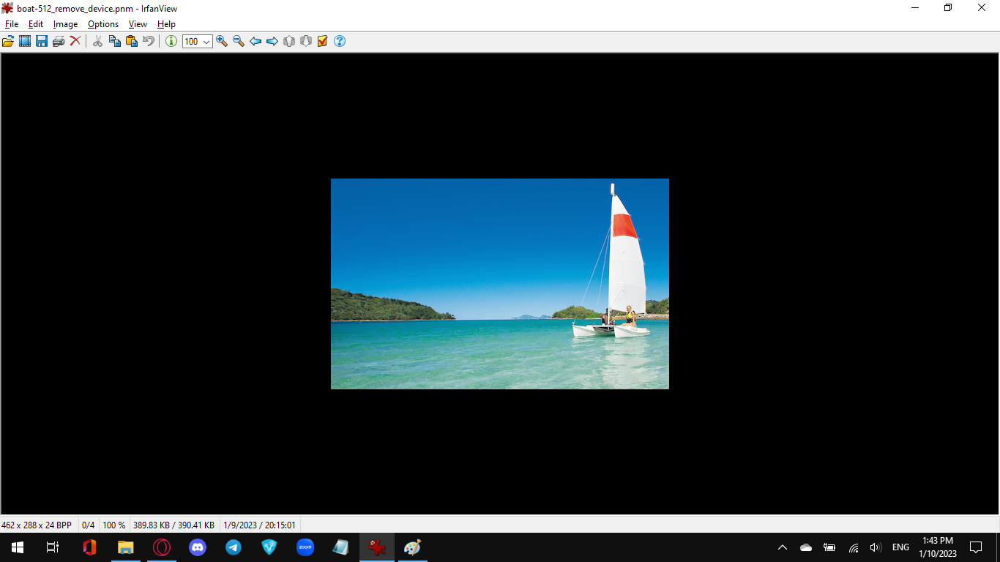

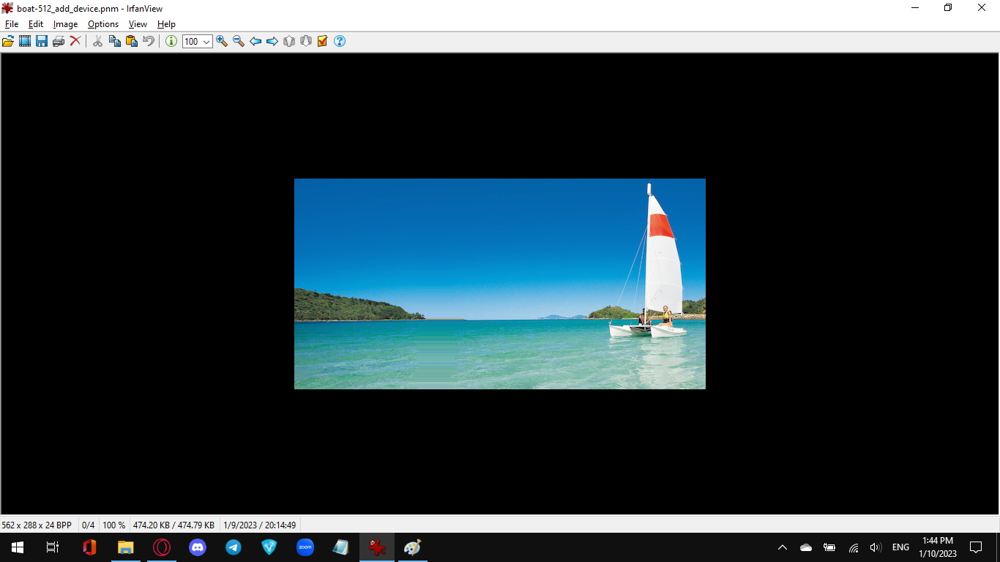

The following pictures will show the result when we remove/add 50 seams to the 1024 pixels picture (respectively) using naive parallel implementation

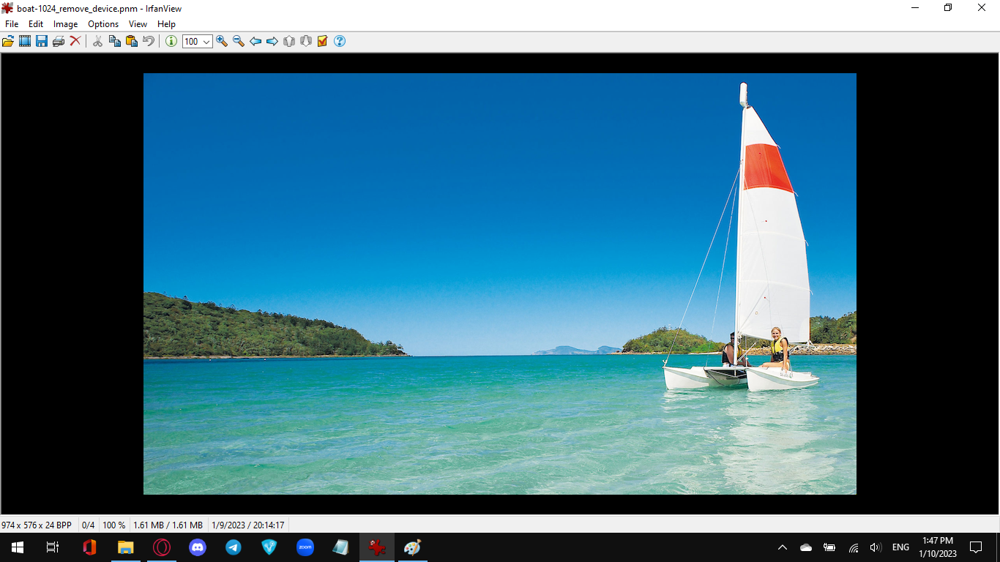

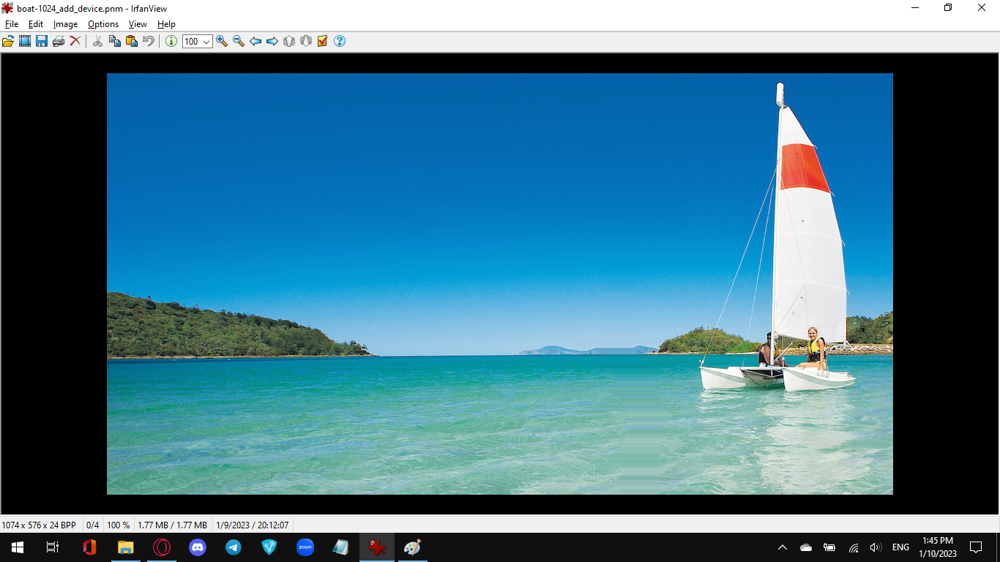

## 4. Parallel implementation + optimization

**Parallel Optimization version 2**

**Analyze + Design**

We will optimize the following steps:

Step 2: Computing pixel energy using edge detection → Use shared memory and constant memory in 2 to compute xSombel and ySombel **respectively**



**Evaluate**

We will delete and add  100 seam in 512 and 1024 pixel pictures using parallel implementation with the above optimizations


**Experiments and result**

Based on the colab results, we can see that the code runs correctly, though the change in speed is not really noticeable

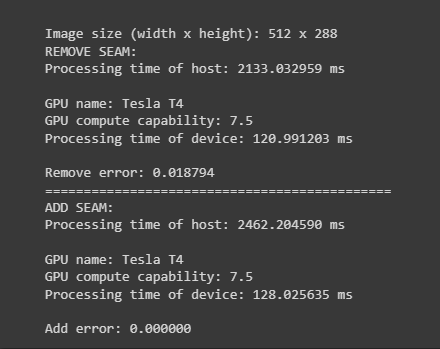

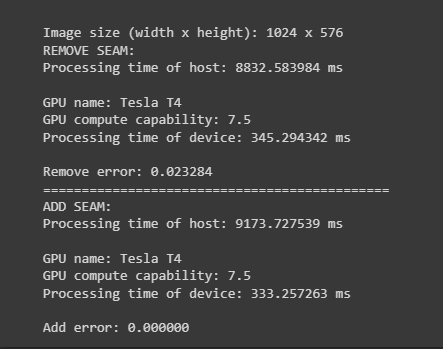

The following pictures will show the result when we remove/add 50 seams to the 512 pixels picture (respectively) using optimized parallel implementation (version 2)

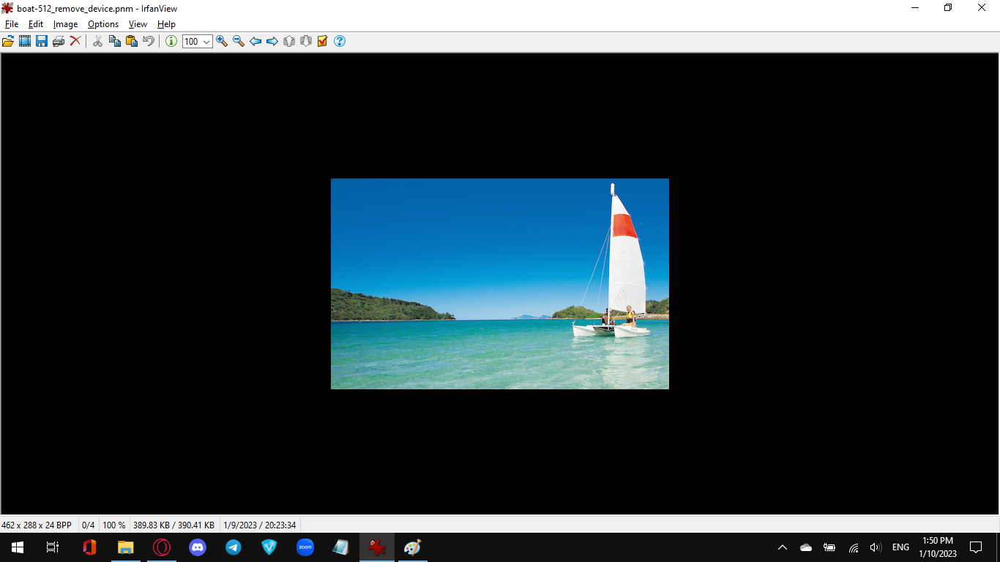

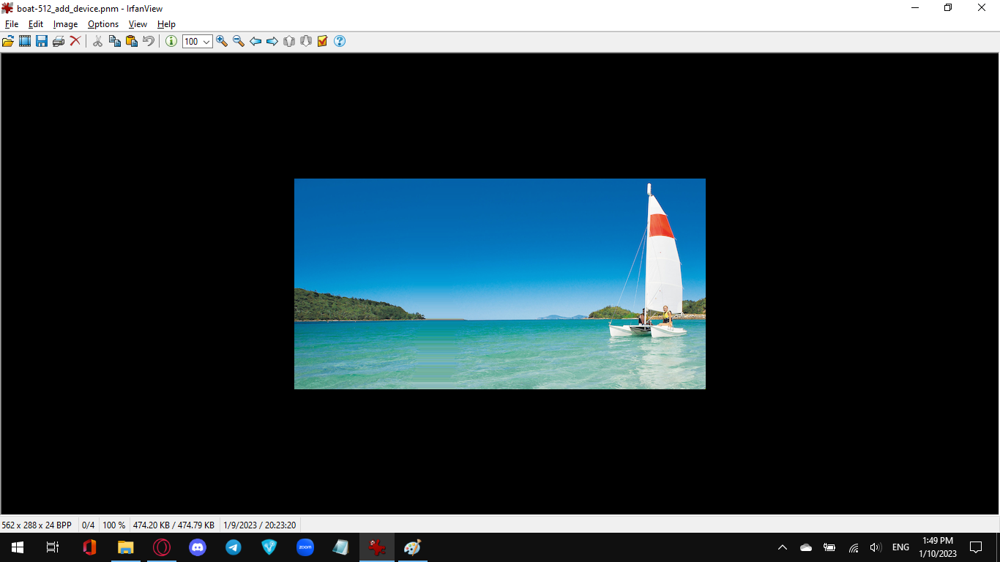

The following pictures will show the result when we remove/add 50 seams to the 1024 pixels picture (respectively) using optimized parallel implementation (version 2)

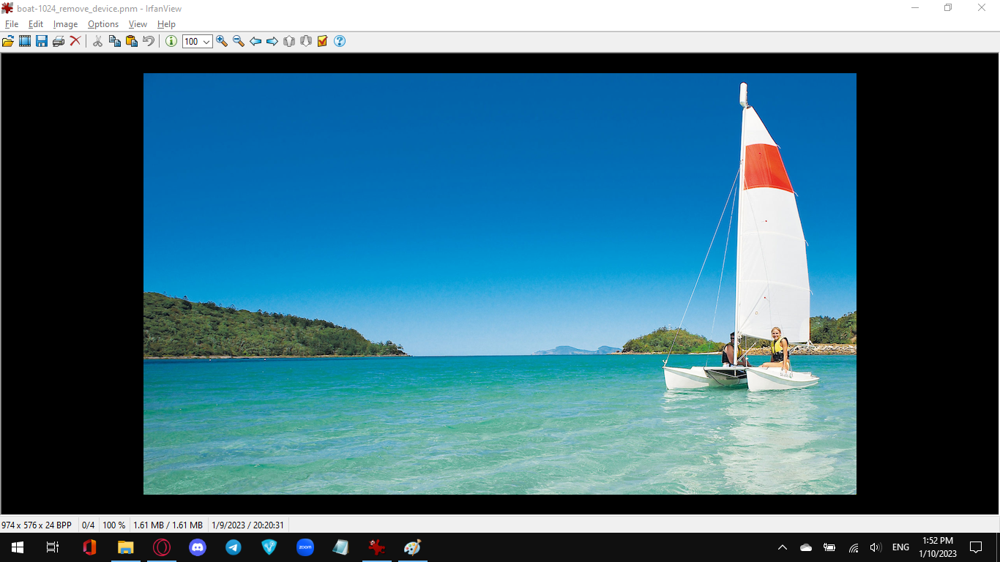

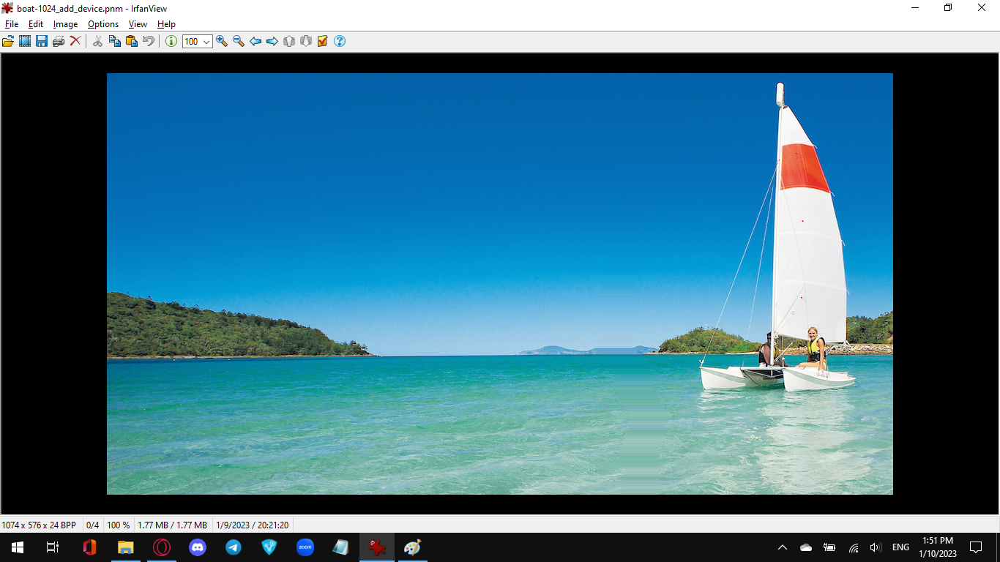

**Parallel Optimization version 3**



**Analyze + Design**

We will optimize the following steps:

Step 2: Computing pixel energy using edge detection → Use shared memory,  constant memory and cuda stream to compute xSombel and ySombel **simutaneously**



**Evaluate**

We will delete and add 50 seam in 512 and 1024 pixel pictures using parallel implementation with the above optimizations

**Experiments and result**

Based on the colab results, we can see that the code runs correctly. Again the change in speed is not really noticeable, I think its due to the allocation of stream for each seam that make it slower.

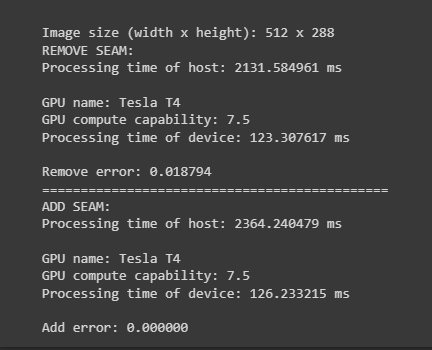

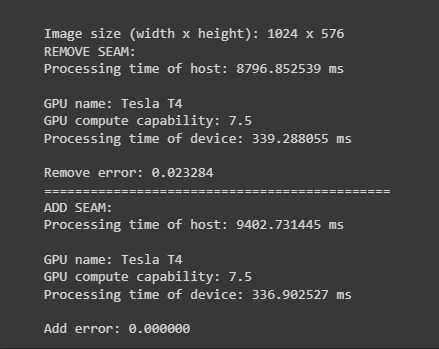

The following pictures will show the result when we remove/add 50 seams to the 512 pixels picture (respectively) using optimized parallel implementation (version 3)

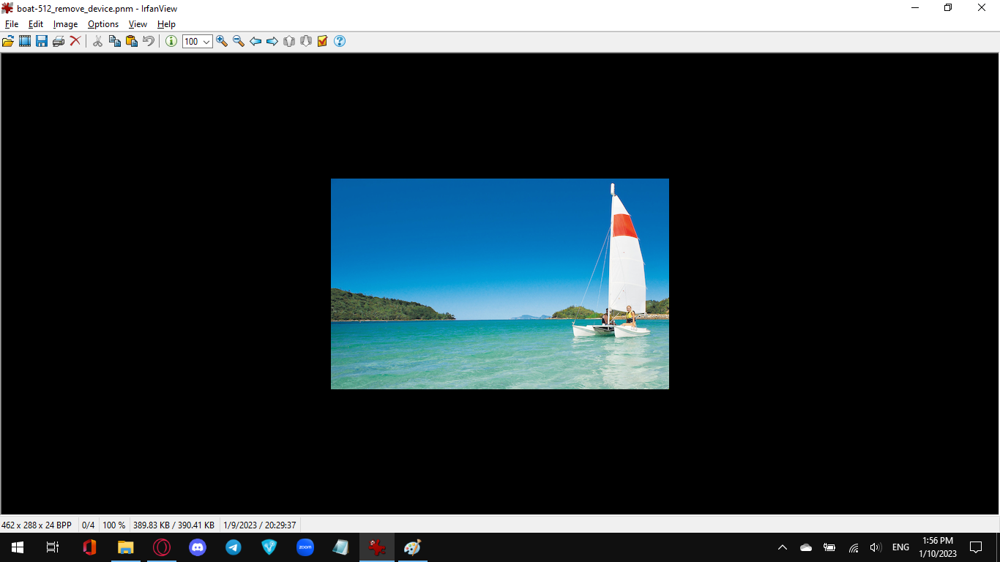


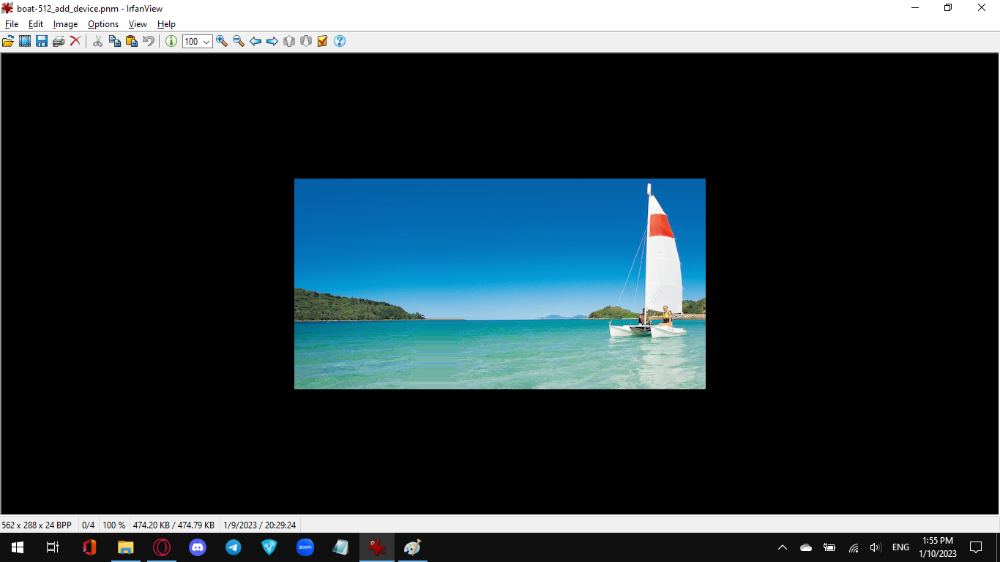

The following pictures will show the result when we remove/add 50 seams to the 1024 pixels picture (respectively) using optimized parallel implementation (version 3)

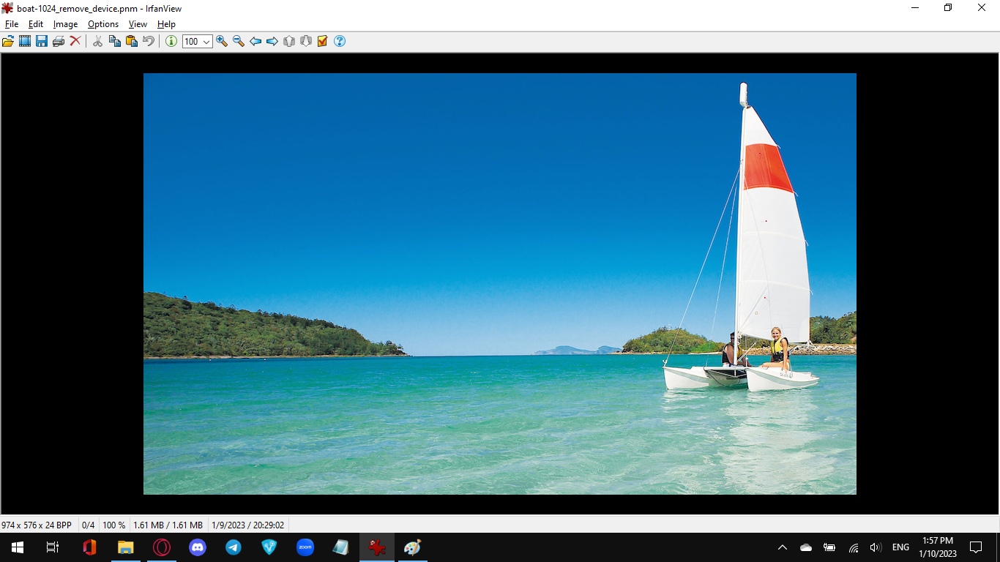

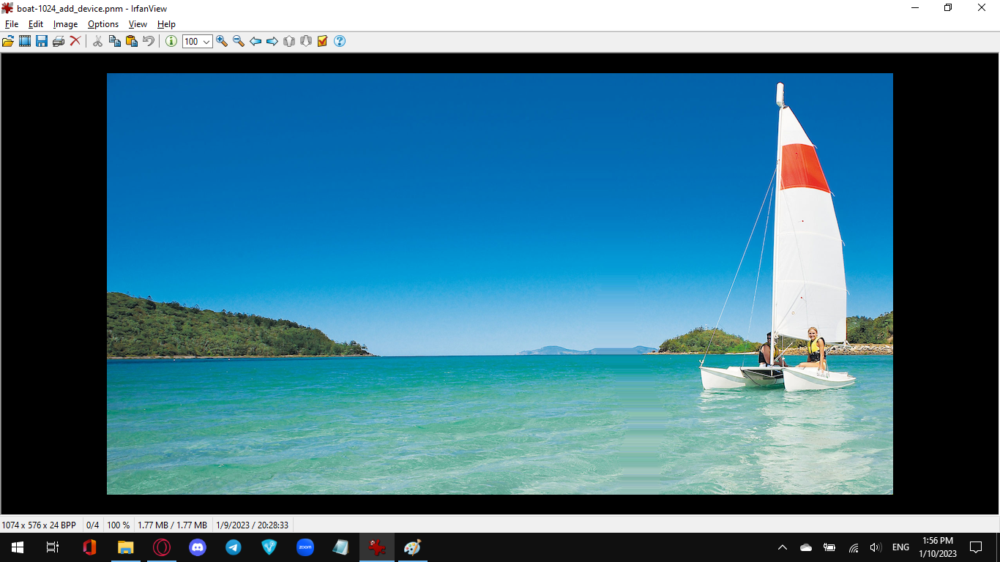

**Parallel Optimization version 4**

**Analyze + Design**

We will optimize the following steps:

Step 2: Computing pixel energy using edge detection → Use shared memory,  constant memory and cuda stream to compute xSombel and ySombel **simutaneously**

Step 3.1: Compute minimum cost table and path table → Attemp to cross block comunication to calculate minCostTable without using for loop in host



**Evaluate**

We will delete and add 50 seam in 512 and 1024 pixel pictures using parallel implementation with the above optimizations

**Experiments and result**

The code does not run correctly because step 3.1 got deadlock

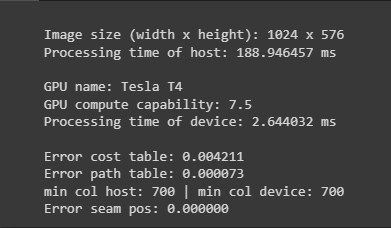

**Idea for add seam non-naive**


**Analyze + Design**

We will optimize the following steps:

* Rather than using reduce to find minimun, we will use bubble sort to find a batch of k minimum min cost path
* With each of these k minimum path, spawn k thread to make k seams. (allow overlap)
* Each thread will check if it handle the duplicated column index, if it does, then copy the average value of the pixel with its left and right.
Or if it not, then simply copy the pixel from original image to the new images.



## 5. Reflection

**Difficulties encountered**

*  Parallel optimization version 4 was not suceedeeed
*  Add seam non-naive is not implemented for we dont have enough time.

**What we learned**

As a group, we learned how to communicate and working as a team and learned about Seam Carving algorithm. We also learned how significant it is to resize pictures on different devices within smallest amount of time.

**If we had more time, we would...**

* Try to finish optimization verson 4.
* Continue to implement non-naive add seam

## 6. References

*   Slides

*   [Seam Carving - Wikipedia ](https://en.wikipedia.org/wiki/Seam_carving#Seams)

*   [Seam Carving Algorithm -  K.Lykov Blog](https://vnoi.info/wiki/cs/imageprocessing/Seam-Carving.md?fbclid=IwAR2cPEv-EQCQI_C80yGWFMJgG9kqzS01THSMyWKNspsN0Rzhk30u37NKNzQ)

*   [gpu-seamcarving - Abhandaru](https://github.com/abhandaru/gpu-seamcarving?fbclid=IwAR24ibOf_4Gf-8VRX5J3KbQEI-cPaQukAmUs1krzv4-fO1aUx_fyNTCFrYM)





